# About Dataset
Machine Predictive Maintenance Classification Dataset
Since real predictive maintenance datasets are generally difficult to obtain and in particular difficult to publish, we present and provide a synthetic dataset that reflects real predictive maintenance encountered in the industry to the best of our knowledge.

The dataset consists of 10 000 data points stored as rows with 14 features in columns

- UID: unique identifier ranging from 1 to 10000
- productID: consisting of a letter L, M, or H for low (50% of all products), medium (30%), and high (20%) as product quality      variants and a variant-specific serial number
- air temperature [K]: generated using a random walk process later normalized to a standard deviation of 2 K around 300 K
- process temperature [K]: generated using a random walk process normalized to a standard deviation of 1 K, added to the air       temperature plus 10 K.
- rotational speed [rpm]: calculated from powepower of 2860 W, overlaid with a normally distributed noise
- torque [Nm]: torque values are normally distributed around 40 Nm with an Ïƒ = 10 Nm and no negative values.
- tool wear [min]: The quality variants H/M/L add 5/3/2 minutes of tool wear to the used tool in the process. and a
  'machine failure' label that indicates, whether the machine has failed in this particular data point for any of the following   failure modes are true.
  
  
Important : There are two Targets - Do not make the mistake of using one of them as feature, as it will lead to leakage.
- Target : Failure or Not
- Failure Type : Type of Failure
#### Acknowledgements
UCI : https://archive.ics.uci.edu/ml/datasets/AI4I+2020+Predictive+Maintenance+Dataset

In [1]:
import numpy as np
import pandas as pd

import seaborn as sns
import matplotlib.pyplot as plt

import warnings
warnings.filterwarnings("ignore")

In [2]:
sns.set_theme(palette='tab10',  
              font='Lucida Calligraphy', 
              font_scale=1.5, 
              rc=None)  


import matplotlib
matplotlib.rcParams.update({'font.size': 15})


plt.style.use('dark_background')

In [3]:
pd.set_option("display.max_columns", None)


pd.set_option("display.max_rows", None)

In [4]:
df = pd.read_csv('predictive_maintenance.csv')

In [5]:
df

,UDI,Product ID,Type,Air temperature [K],Process temperature [K],Rotational speed [rpm],Torque [Nm],Tool wear [min],Target,Failure Type
0,1,M14860,M,298.1,308.6,1551,42.8,0,0,No Failure
1,2,L47181,L,298.2,308.7,1408,46.3,3,0,No Failure
2,3,L47182,L,298.1,308.5,1498,49.4,5,0,No Failure
3,4,L47183,L,298.2,308.6,1433,39.5,7,0,No Failure
4,5,L47184,L,298.2,308.7,1408,40.0,9,0,No Failure
5,6,M14865,M,298.1,308.6,1425,41.9,11,0,No Failure
6,7,L47186,L,298.1,308.6,1558,42.4,14,0,No Failure
7,8,L47187,L,298.1,308.6,1527,40.2,16,0,No Failure
8,9,M14868,M,298.3,308.7,1667,28.6,18,0,No Failure
9,10,M14869,M,298.5,309.0,1741,28.0,21,0,No Failure


In [6]:
df.head()

,UDI,Product ID,Type,Air temperature [K],Process temperature [K],Rotational speed [rpm],Torque [Nm],Tool wear [min],Target,Failure Type
0,1,M14860,M,298.1,308.6,1551,42.8,0,0,No Failure
1,2,L47181,L,298.2,308.7,1408,46.3,3,0,No Failure
2,3,L47182,L,298.1,308.5,1498,49.4,5,0,No Failure
3,4,L47183,L,298.2,308.6,1433,39.5,7,0,No Failure
4,5,L47184,L,298.2,308.7,1408,40.0,9,0,No Failure


In [7]:
df.tail()

,UDI,Product ID,Type,Air temperature [K],Process temperature [K],Rotational speed [rpm],Torque [Nm],Tool wear [min],Target,Failure Type
9995,9996,M24855,M,298.8,308.4,1604,29.5,14,0,No Failure
9996,9997,H39410,H,298.9,308.4,1632,31.8,17,0,No Failure
9997,9998,M24857,M,299.0,308.6,1645,33.4,22,0,No Failure
9998,9999,H39412,H,299.0,308.7,1408,48.5,25,0,No Failure
9999,10000,M24859,M,299.0,308.7,1500,40.2,30,0,No Failure


In [8]:
df.sample(5)

,UDI,Product ID,Type,Air temperature [K],Process temperature [K],Rotational speed [rpm],Torque [Nm],Tool wear [min],Target,Failure Type
4057,4058,L51237,L,302.0,310.9,1495,38.6,52,0,No Failure
7291,7292,L54471,L,300.2,310.5,1416,46.7,90,0,No Failure
2688,2689,L49868,L,299.9,309.4,1322,53.9,33,0,No Failure
3013,3014,L50193,L,300.5,309.6,1390,48.4,194,0,No Failure
5307,5308,L52487,L,304.0,313.3,1530,34.8,211,0,No Failure


In [9]:
# Drop redundant Column from dataset
df = df.drop(["UDI", "Product ID"], axis=1)

In [10]:
df['Target'].value_counts()

Target
0    9661
1     339
Name: count, dtype: int64

In [11]:
df.head()

,Type,Air temperature [K],Process temperature [K],Rotational speed [rpm],Torque [Nm],Tool wear [min],Target,Failure Type
0,M,298.1,308.6,1551,42.8,0,0,No Failure
1,L,298.2,308.7,1408,46.3,3,0,No Failure
2,L,298.1,308.5,1498,49.4,5,0,No Failure
3,L,298.2,308.6,1433,39.5,7,0,No Failure
4,L,298.2,308.7,1408,40.0,9,0,No Failure


In [12]:
df.sample(10).style.set_properties(
    **{
        'background-color': 'Brown',  
        'color': 'white', 
        'border-color': 'White'  
    })

,Type,Air temperature [K],Process temperature [K],Rotational speed [rpm],Torque [Nm],Tool wear [min],Target,Failure Type
6074,M,301.000000,310.800000,1533,39.300000,194,0,No Failure
4714,H,303.400000,311.800000,1693,28.300000,175,0,No Failure
9545,L,299.600000,311.000000,1430,38.300000,124,0,No Failure
4760,L,303.600000,311.700000,1546,38.500000,64,0,No Failure
9032,L,297.400000,308.300000,1723,28.800000,33,0,No Failure
9902,H,298.700000,309.300000,1402,45.300000,190,0,No Failure
4346,L,301.800000,309.700000,1598,30.400000,124,0,No Failure
7185,L,300.300000,310.400000,1672,29.200000,39,0,No Failure
589,L,297.600000,309.400000,1491,40.200000,231,0,No Failure
3546,M,301.900000,310.900000,1317,51.900000,40,0,No Failure


In [13]:
df["Air temperature [K]"] = df["Air temperature [K]"] - 273.15
df["Process temperature [K]"] = df["Process temperature [K]"] - 273.15

In [14]:
df.head()

,Type,Air temperature [K],Process temperature [K],Rotational speed [rpm],Torque [Nm],Tool wear [min],Target,Failure Type
0,M,24.95,35.45,1551,42.8,0,0,No Failure
1,L,25.05,35.55,1408,46.3,3,0,No Failure
2,L,24.95,35.35,1498,49.4,5,0,No Failure
3,L,25.05,35.45,1433,39.5,7,0,No Failure
4,L,25.05,35.55,1408,40.0,9,0,No Failure


In [15]:
df.rename(columns={"Air temperature [K]": "Air temperature [°C]", "Process temperature [K]": "Process temperature [°C]"}, inplace=True)

In [16]:
df.head()

,Type,Air temperature [°C],Process temperature [°C],Rotational speed [rpm],Torque [Nm],Tool wear [min],Target,Failure Type
0,M,24.95,35.45,1551,42.8,0,0,No Failure
1,L,25.05,35.55,1408,46.3,3,0,No Failure
2,L,24.95,35.35,1498,49.4,5,0,No Failure
3,L,25.05,35.45,1433,39.5,7,0,No Failure
4,L,25.05,35.55,1408,40.0,9,0,No Failure


In [17]:
# feature Construction
df["Temperature difference [°C]"] = df["Process temperature [°C]"] - df["Air temperature [°C]"]
df.sample(5)

,Type,Air temperature [°C],Process temperature [°C],Rotational speed [rpm],Torque [Nm],Tool wear [min],Target,Failure Type,Temperature difference [°C]
3684,L,28.85,38.05,1270,65.3,182,1,Overstrain Failure,9.2
9283,M,25.15,35.85,1802,27.5,71,0,No Failure,10.7
7401,L,26.65,37.65,1409,51.9,154,0,No Failure,11.0
5302,L,30.75,39.95,1491,37.2,195,0,No Failure,9.2
9827,M,25.15,36.15,1376,57.0,198,0,No Failure,11.0


In [18]:
df.shape

(10000, 9)

In [19]:
df.size

90000

In [20]:
len(df)

10000

In [21]:
df.info() 

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10000 entries, 0 to 9999
Data columns (total 9 columns):
 #   Column                       Non-Null Count  Dtype  
---  ------                       --------------  -----  
 0   Type                         10000 non-null  object 
 1   Air temperature [°C]         10000 non-null  float64
 2   Process temperature [°C]     10000 non-null  float64
 3   Rotational speed [rpm]       10000 non-null  int64  
 4   Torque [Nm]                  10000 non-null  float64
 5   Tool wear [min]              10000 non-null  int64  
 6   Target                       10000 non-null  int64  
 7   Failure Type                 10000 non-null  object 
 8   Temperature difference [°C]  10000 non-null  float64
dtypes: float64(4), int64(3), object(2)
memory usage: 703.3+ KB


In [22]:
df.describe()

,Air temperature [°C],Process temperature [°C],Rotational speed [rpm],Torque [Nm],Tool wear [min],Target,Temperature difference [°C]
count,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000
mean,26.854930,36.855560,1538.776100,39.986910,107.951000,0.033900,10.000630
std,2.000259,1.483734,179.284096,9.968934,63.654147,0.180981,1.001094
min,22.150000,32.550000,1168.000000,3.800000,0.000000,0.000000,7.600000
25%,25.150000,35.650000,1423.000000,33.200000,53.000000,0.000000,9.300000
50%,26.950000,36.950000,1503.000000,40.100000,108.000000,0.000000,9.800000
75%,28.350000,37.950000,1612.000000,46.800000,162.000000,0.000000,11.000000
max,31.350000,40.650000,2886.000000,76.600000,253.000000,1.000000,12.100000


In [23]:
df.describe().style.background_gradient(cmap="magma")


,Air temperature [°C],Process temperature [°C],Rotational speed [rpm],Torque [Nm],Tool wear [min],Target,Temperature difference [°C]
count,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000
mean,26.854930,36.855560,1538.776100,39.986910,107.951000,0.033900,10.000630
std,2.000259,1.483734,179.284096,9.968934,63.654147,0.180981,1.001094
min,22.150000,32.550000,1168.000000,3.800000,0.000000,0.000000,7.600000
25%,25.150000,35.650000,1423.000000,33.200000,53.000000,0.000000,9.300000
50%,26.950000,36.950000,1503.000000,40.100000,108.000000,0.000000,9.800000
75%,28.350000,37.950000,1612.000000,46.800000,162.000000,0.000000,11.000000
max,31.350000,40.650000,2886.000000,76.600000,253.000000,1.000000,12.100000


 # <font color='Blue'>Explorfatory Data Analysis</font>

In [24]:
#!pip install missingno

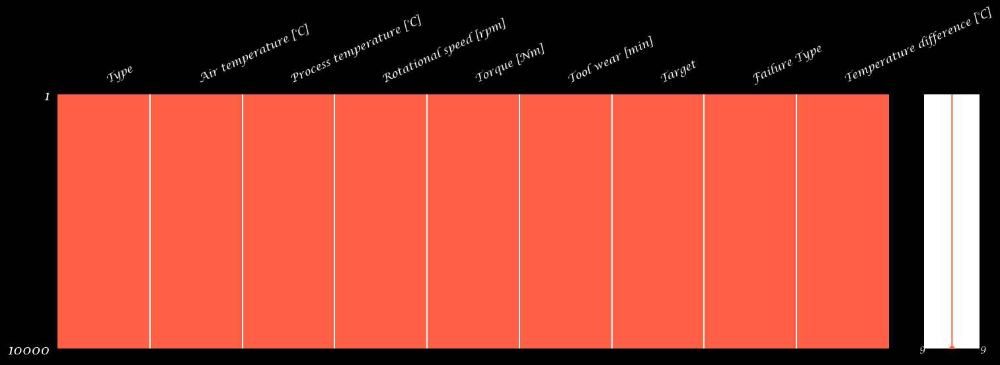

In [25]:
import missingno as msno

# check missing value
msno.matrix(df, figsize=(18, 5), fontsize=12, color=(1, 0.38, 0.27))


plt.xticks(rotation=25)
plt.show()

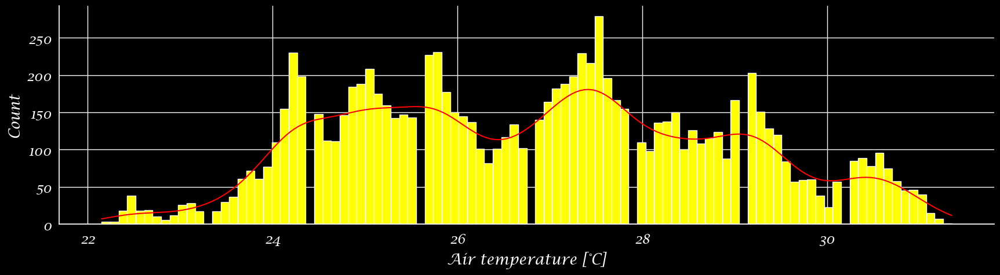

In [53]:
sns.displot(data=df, x="Air temperature [°C]", kde=True, bins=100, color="red", facecolor="yellow", height=5, aspect=3.5)

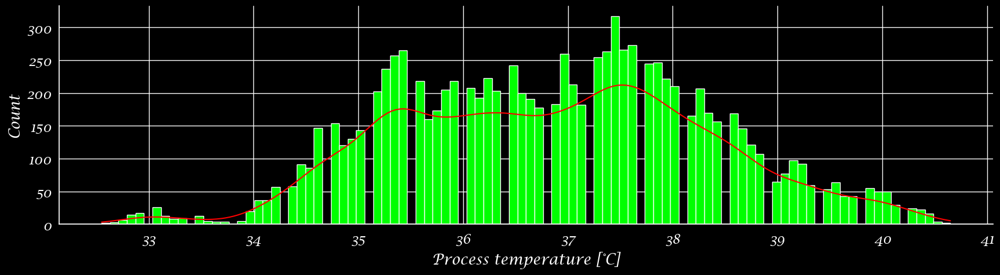

In [27]:
sns.displot(data=df, x="Process temperature [°C]", kde=True, bins = 100,color = "red", facecolor = "lime",height = 5, aspect = 3.5);

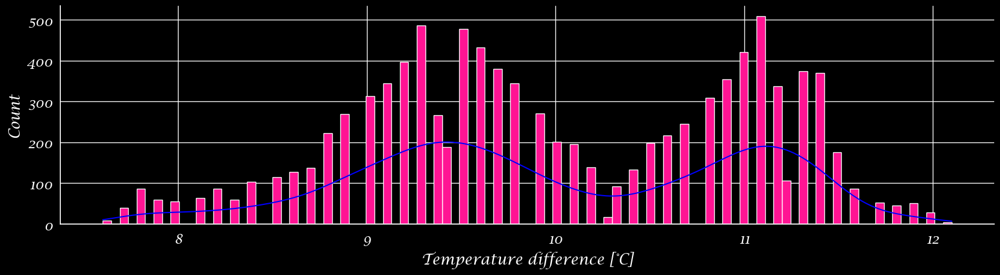

In [28]:
sns.displot(data=df, x="Temperature difference [°C]", kde=True, bins = 100,color = "blue", facecolor = "DeepPink",height = 5, aspect = 3.5);

# Count Each Categorical Column

In [29]:
df['Type'].value_counts()

Type
L    6000
M    2997
H    1003
Name: count, dtype: int64

In [30]:
for col in df[['Type', 'Target', 'Failure Type']]:
    
    print(df[col].value_counts())
    
    
    print("****" * 8)

Type
L    6000
M    2997
H    1003
Name: count, dtype: int64
********************************
Target
0    9661
1     339
Name: count, dtype: int64
********************************
Failure Type
No Failure                  9652
Heat Dissipation Failure     112
Power Failure                 95
Overstrain Failure            78
Tool Wear Failure             45
Random Failures               18
Name: count, dtype: int64
********************************


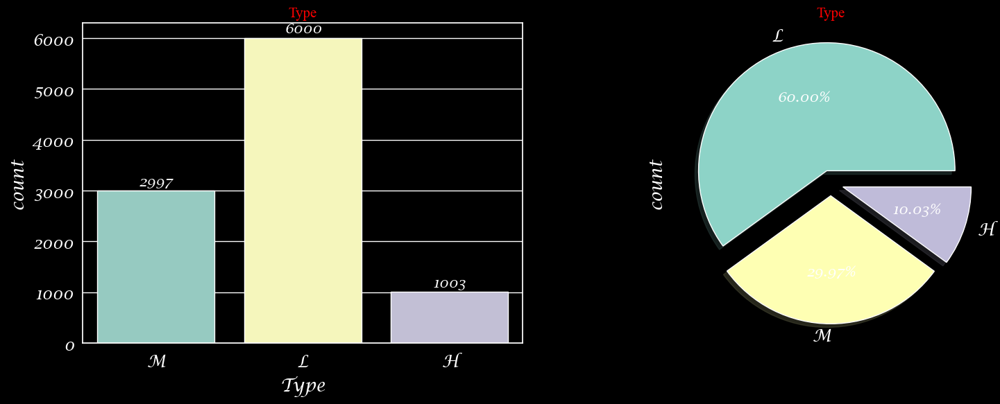

In [31]:
plt.figure(figsize=(18, 6))


plt.subplot(1, 2, 1)
sns.countplot(x='Type', data=df)
plt.bar_label(plt.gca().containers[0]) 
plt.title("Type", fontsize=20, color='Red', font='Times New Roman')


plt.subplot(1, 2, 2)
df['Type'].value_counts().plot.pie(explode=[0.1, 0.1, 0.1], autopct='%1.2f%%', shadow=True)
plt.title("Type", fontsize=20, color='Red', font='Times New Roman')


plt.show()

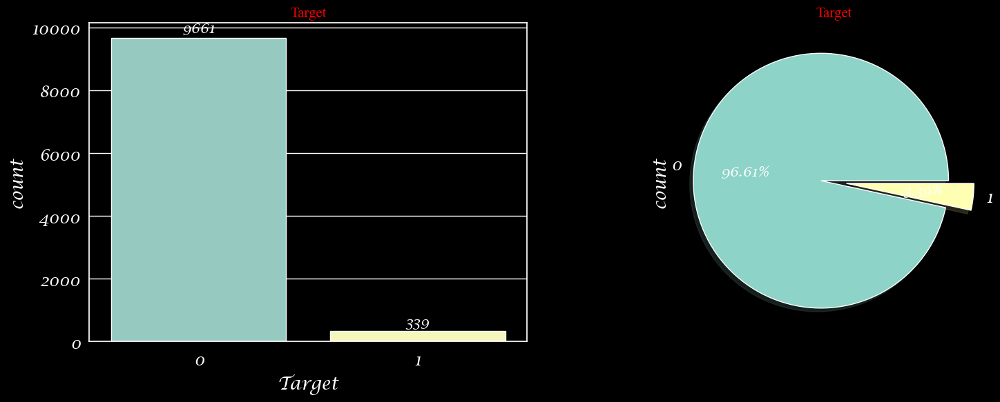

In [32]:

plt.figure(figsize=(18, 6))


plt.subplot(1, 2, 1)
sns.countplot(x='Target', data=df)
plt.bar_label(plt.gca().containers[0])  
plt.title("Target", fontsize=20, color='Red', font='Times New Roman')

plt.subplot(1, 2, 2)
df['Target'].value_counts().plot.pie(explode=[0.1, 0.1], autopct='%1.2f%%', shadow=True)
plt.title("Target", fontsize=20, color='Red', font='Times New Roman')


plt.show()

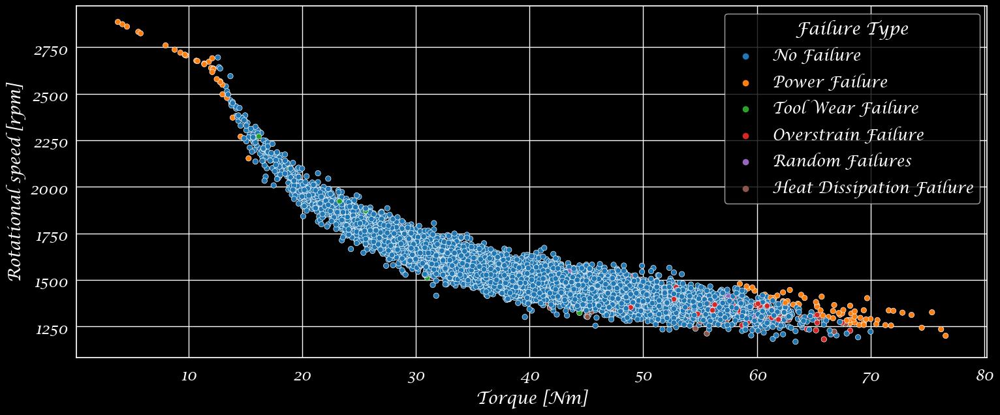

In [33]:
plt.figure(figsize=(18, 7))

sns.scatterplot(data=df, x="Torque [Nm]", y="Rotational speed [rpm]", hue="Failure Type", palette="tab10");

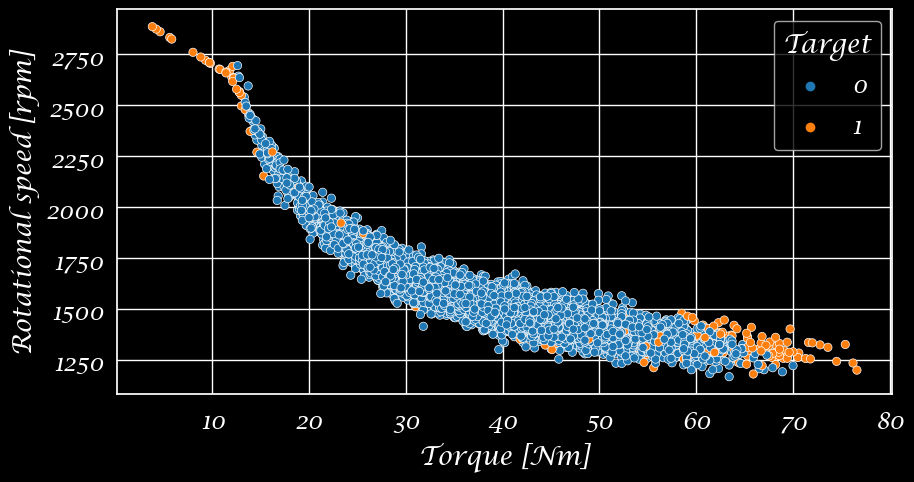

In [54]:

plt.figure(figsize=(10,5))

sns.scatterplot(data=df, x="Torque [Nm]", y="Rotational speed [rpm]", hue="Target",palette="tab10");

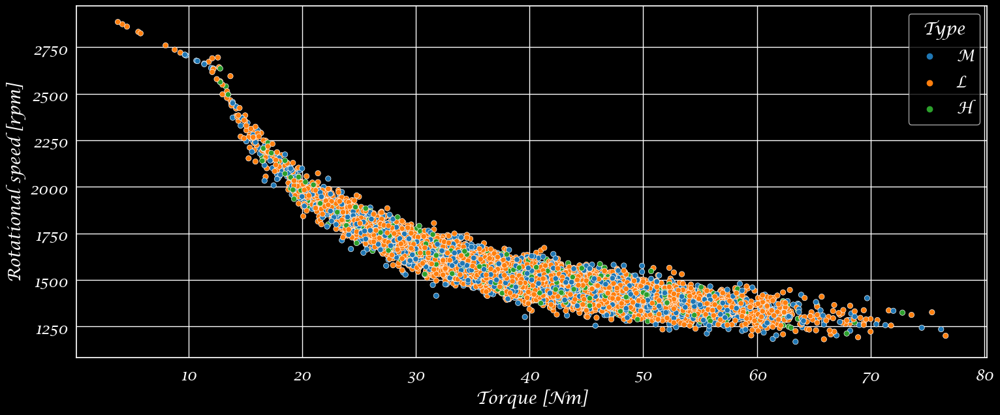

In [35]:
plt.figure(figsize=(18,7))

sns.scatterplot(data=df, x="Torque [Nm]", y="Rotational speed [rpm]", hue="Type",palette="tab10");

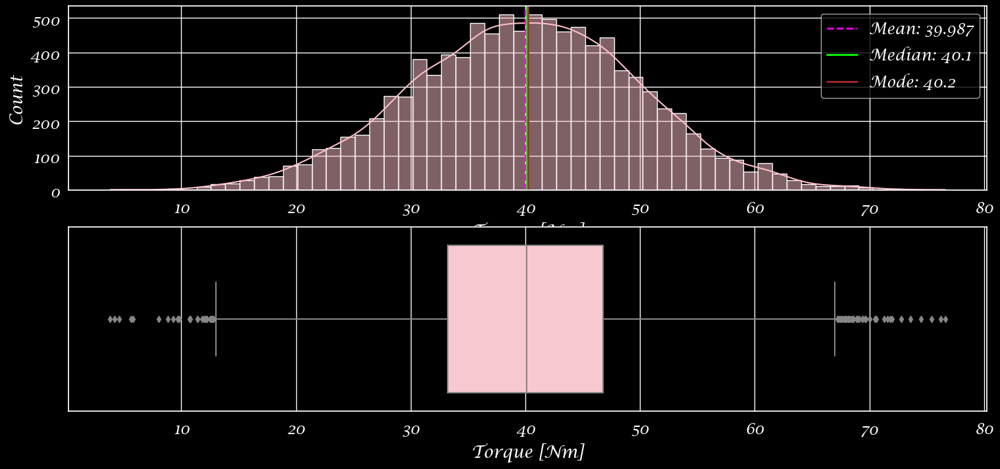

In [36]:
import statistics

def plot_hist(feature):
   
    fig, ax = plt.subplots(2, 1, figsize=(18, 8))
    
   
    sns.histplot(data=df[feature], kde=True, ax=ax[0], color='pink')

    
    ax[0].axvline(x=df[feature].mean(), color='Magenta', linestyle='--', linewidth=2, label='Mean: {}'.format(round(df[feature].mean(), 3)))
    ax[0].axvline(x=df[feature].median(), color='lime', linewidth=2, label='Median: {}'.format(round(df[feature].median(), 3)))
    ax[0].axvline(x=statistics.mode(df[feature]), color='brown', linewidth=2, label='Mode: {}'.format(statistics.mode(df[feature])))
    
    
    ax[0].legend()
   
    sns.boxplot(x=df[feature], ax=ax[1], color='pink')
    
   
    plt.show()


plot_hist('Torque [Nm]')
    

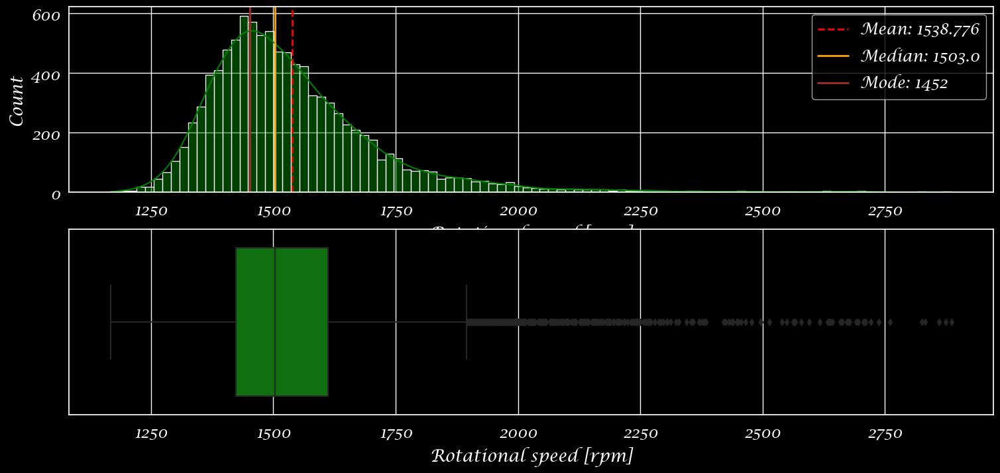

In [37]:
def plot_hist(feature):
    
    fig, ax = plt.subplots(2, 1, figsize=(18, 8))
    
    
    sns.histplot(data=df[feature], kde=True, ax=ax[0], color='green')

    
    ax[0].axvline(x=df[feature].mean(), color='red', linestyle='--', linewidth=2, label='Mean: {}'.format(round(df[feature].mean(), 3)))
    ax[0].axvline(x=df[feature].median(), color='orange', linewidth=2, label='Median: {}'.format(round(df[feature].median(), 3)))
    ax[0].axvline(x=statistics.mode(df[feature]), color='brown', linewidth=2, label='Mode: {}'.format(statistics.mode(df[feature])))
    
    
    ax[0].legend()
    
  
    sns.boxplot(x=df[feature], ax=ax[1], color='green')
    plt.show()


plot_hist('Rotational speed [rpm]')  

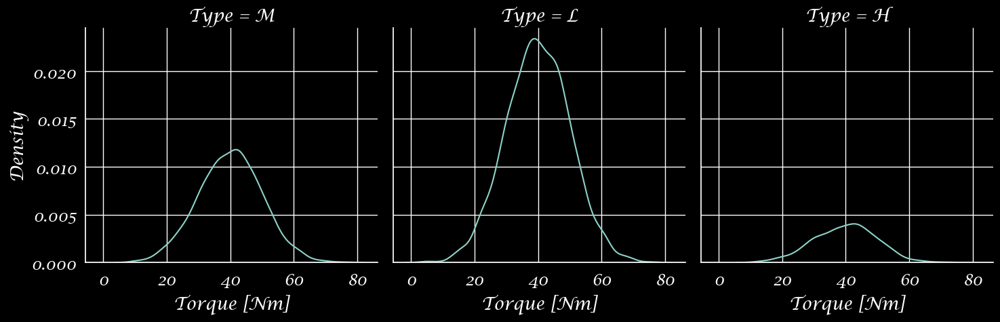

In [38]:
sns.displot(data=df, x="Torque [Nm]", col="Type", kind="kde")

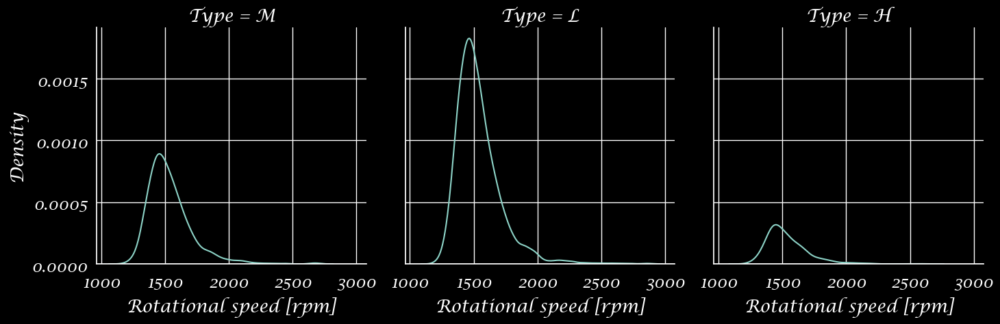

In [39]:
sns.displot(data=df, x="Rotational speed [rpm]", col="Type", kind="kde");

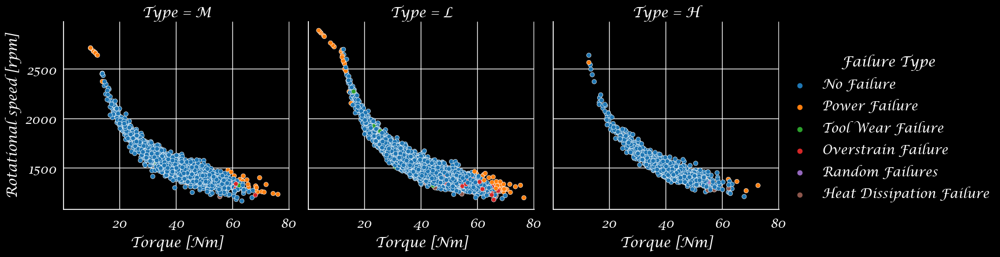

In [40]:
sns.relplot(data=df, x="Torque [Nm]", y="Rotational speed [rpm]", hue="Failure Type",col="Type",palette='tab10');

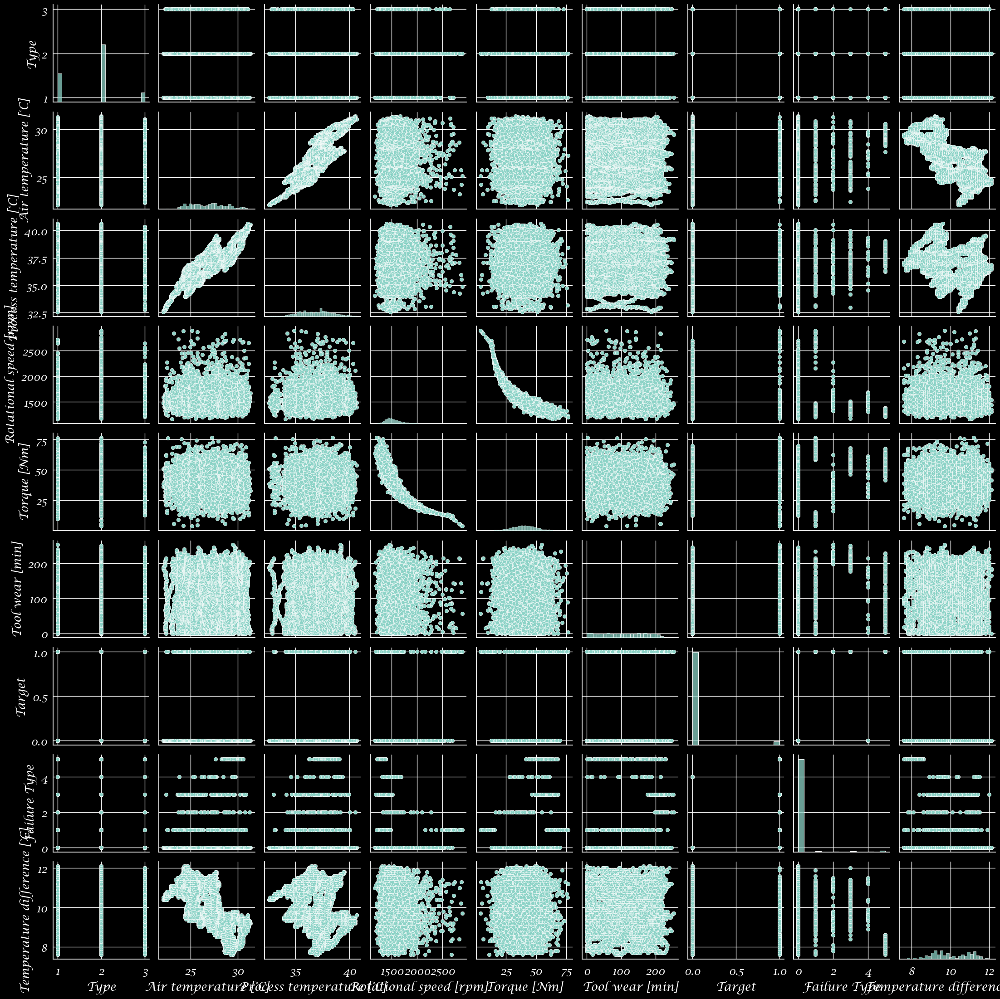

In [56]:
sns.pairplot(df)

# Feature seslection

In [41]:
from sklearn.preprocessing import LabelEncoder, OrdinalEncoder

In [42]:
df.head()

,Type,Air temperature [°C],Process temperature [°C],Rotational speed [rpm],Torque [Nm],Tool wear [min],Target,Failure Type,Temperature difference [°C]
0,M,24.95,35.45,1551,42.8,0,0,No Failure,10.5
1,L,25.05,35.55,1408,46.3,3,0,No Failure,10.5
2,L,24.95,35.35,1498,49.4,5,0,No Failure,10.4
3,L,25.05,35.45,1433,39.5,7,0,No Failure,10.4
4,L,25.05,35.55,1408,40.0,9,0,No Failure,10.5


In [43]:
#!pip install category_encoders

In [57]:
import category_encoders as ce
encoder = ce.OrdinalEncoder(cols=['Type', 'Failure Type'])

df = encoder.fit_transform(df)
df.head(2)

,Type,Air temperature [°C],Process temperature [°C],Rotational speed [rpm],Torque [Nm],Tool wear [min],Target,Failure Type,Temperature difference [°C]
0,1,24.95,35.45,1551,42.8,0,0,1,10.5
1,2,25.05,35.55,1408,46.3,3,0,1,10.5


In [45]:
from sklearn.preprocessing import LabelEncoder


scaler = LabelEncoder()

df['Failure Type'] = scaler.fit_transform(df['Failure Type'])

In [46]:
df.head()

,Type,Air temperature [°C],Process temperature [°C],Rotational speed [rpm],Torque [Nm],Tool wear [min],Target,Failure Type,Temperature difference [°C]
0,1,24.95,35.45,1551,42.8,0,0,0,10.5
1,2,25.05,35.55,1408,46.3,3,0,0,10.5
2,2,24.95,35.35,1498,49.4,5,0,0,10.4
3,2,25.05,35.45,1433,39.5,7,0,0,10.4
4,2,25.05,35.55,1408,40.0,9,0,0,10.5


In [47]:
df['Target'].value_counts()

Target
0    9661
1     339
Name: count, dtype: int64

In [48]:
X = df.drop(columns="Target", axis=1)  
y = df["Target"] 

In [58]:
X

,Type,Air temperature [°C],Process temperature [°C],Rotational speed [rpm],Torque [Nm],Tool wear [min],Failure Type,Temperature difference [°C]
0,1,24.95,35.45,1551,42.8,0,0,10.5
1,2,25.05,35.55,1408,46.3,3,0,10.5
2,2,24.95,35.35,1498,49.4,5,0,10.4
3,2,25.05,35.45,1433,39.5,7,0,10.4
4,2,25.05,35.55,1408,40.0,9,0,10.5
5,1,24.95,35.45,1425,41.9,11,0,10.5
6,2,24.95,35.45,1558,42.4,14,0,10.5
7,2,24.95,35.45,1527,40.2,16,0,10.5
8,1,25.15,35.55,1667,28.6,18,0,10.4
9,1,25.35,35.85,1741,28.0,21,0,10.5


In [59]:
y

0       0
1       0
2       0
3       0
4       0
5       0
6       0
7       0
8       0
9       0
10      0
11      0
12      0
13      0
14      0
15      0
16      0
17      0
18      0
19      0
20      0
21      0
22      0
23      0
24      0
25      0
26      0
27      0
28      0
29      0
30      0
31      0
32      0
33      0
34      0
35      0
36      0
37      0
38      0
39      0
40      0
41      0
42      0
43      0
44      0
45      0
46      0
47      0
48      0
49      0
50      1
51      0
52      0
53      0
54      0
55      0
56      0
57      0
58      0
59      0
60      0
61      0
62      0
63      0
64      0
65      0
66      0
67      0
68      0
69      1
70      0
71      0
72      0
73      0
74      0
75      0
76      0
77      1
78      0
79      0
80      0
81      0
82      0
83      0
84      0
85      0
86      0
87      0
88      0
89      0
90      0
91      0
92      0
93      0
94      0
95      0
96      0
97      0
98      0
99      0


In [66]:
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=22)

In [67]:
X_train.shape

(8000, 8)

In [68]:
X_train.head()

,Type,Air temperature [°C],Process temperature [°C],Rotational speed [rpm],Torque [Nm],Tool wear [min],Failure Type,Temperature difference [°C]
3821,2,29.15,37.75,1596,33.5,104,0,8.6
6136,3,27.75,37.65,1390,40.6,131,0,9.9
8161,3,26.45,37.85,1714,30.2,128,0,11.4
655,2,24.55,35.95,1435,38.8,165,0,11.4
2950,1,27.55,36.35,1445,46.4,24,0,8.8


In [69]:
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix
from sklearn.linear_model import LogisticRegression


logreg = LogisticRegression()
logreg.fit(X_train, y_train)


y_pred_lr = logreg.predict(X_test)



In [70]:

log_train = round(logreg.score(X_train, y_train) * 100, 2)
log_accuracy = round(accuracy_score(y_test, y_pred_lr) * 100, 2)

print("Training Accuracy    :", log_train, "%")
print("Model Accuracy Score :", log_accuracy, "%")
print("\033[1m--------------------------------------------------------\033[0m")
print("Classification_Report: \n", classification_report(y_test, y_pred_lr))
print("\033[1m--------------------------------------------------------\033[0m")




Training Accuracy    : 99.25 %
Model Accuracy Score : 99.3 %
--------------------------------------------------------
Classification_Report: 
               precision    recall  f1-score   support

           0       0.99      1.00      1.00      1930
           1       0.97      0.83      0.89        70

    accuracy                           0.99      2000
   macro avg       0.98      0.91      0.94      2000
weighted avg       0.99      0.99      0.99      2000

--------------------------------------------------------


In [52]:
confusion_matrix(y_test, y_pred_lr)

array([[1920,    3],
       [  14,   63]], dtype=int64)

In [73]:
(1920+63)/2000

0.9915

# KNN Model

In [72]:
pd.DataFrame({'Actual':y_test, 'Predicted':y_pred_lr})

,Actual,Predicted
2077,0,0
9207,0,0
6755,0,0
6704,0,0
9528,0,0
7421,0,0
2578,0,0
9479,0,0
2176,0,0
8572,0,0
